<a href="https://colab.research.google.com/github/StevTMU/buying-house-challenge/blob/main/Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd #使用DataFrame
import json         #圖資採用json格式儲存
import folium       #與地圖有關的套件

from google.colab import drive
drive.mount('/content/drive')

!pip install pandas 
!pip install ipywidgets
# !pip install matplotlib
!pip install IPython
!pip install folium
import pandas as pd
import ipywidgets as widgets
from IPython.display import display
import matplotlib.pyplot as plt
import json
import numpy as np
from folium.plugins import TimeSliderChoropleth
from folium.plugins import TimestampedWmsTileLayers
from folium.plugins import MarkerCluster
from folium.plugins import DualMap
from folium.plugins import HeatMap
from folium.plugins import Search
import folium
from IPython.display import clear_output

Mounted at /content/drive
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 2.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# options 需要填入一個list for various使用情境
#dropdown就是下拉式表單
dropdown = widgets.Dropdown(
    options=['有車位房價', '無車位房價'],
    value='有車位房價',
    description='房子:',
    disabled=False,
  )
display(dropdown)

Dropdown(description='房子:', options=('有車位房價', '無車位房價'), value='有車位房價')

In [ ]:
def map_select(sender): 
  myMap = folium.Map([25.025322205605477, 121.56154318737715], zoom_start=14)

  fileAQI = pd.read_csv("/content/drive/Shareddrives/程式黑客松2022/data們/AQI.final.csv", header=2)

  file = open('/content/drive/Shareddrives/程式黑客松2022/data們/roc.json', encoding="utf8")
  file = json.load(file)

  villTooltip = folium.GeoJsonTooltip(['NAME_2014'], ['名字'])

  Village = folium.GeoJson(file, tooltip = villTooltip).add_to(myMap)
  myMap.fit_bounds(Village.get_bounds())


#header的運用：從第幾列開始讀取：header數值會影響欄位名稱，會造成讀取資料的影響
#fileAQI.dropna(inplace = True)

############################################
#資料缺乏觀測站位置，沒有意義，已手動補齊
#AQI_type = fileAQI["AQI_type"]
  myIcon = folium.CustomIcon('/content/drive/Shareddrives/程式黑客松2022/data們/AQIclass.jpg',
                          icon_size = (380, 150),
                          icon_anchor = (0, 0))
  folium.Marker([26.059053234206612, 122.34858731419666], icon = myIcon).add_to(myMap)

  ilusIcon = folium.CustomIcon('/content/drive/Shareddrives/程式黑客松2022/data們/圖資icon.png',
                          icon_size = (300, 200),
                          icon_anchor = (0, 0))
  folium.Marker([22.91489162756205, 121.61250333835804], icon = ilusIcon).add_to(myMap)

  for index,value in fileAQI.iterrows():
        #AQI:
        #myIcon = folium.Icon(icon ="cloud",color="red")
        #房價：
        #myIcon = folium.Icon(icon ="house",color="red")

        ##or挑戰while迴圈，但AQI_110_average值相近，目前先顯示在popup就好
        #while value(AQI_type):
        #elif value(AQI_type):
        #else value(AQI_type):

        #value(AQI_type)會顯示error: series are not callable; value[AQI_type]就可以：因value是dataframe()
        #依使用者所需，範圍選定.五十萬以上  2.三十~五十萬  3.二十五到三十萬   4.二十到二十五萬   5.二十萬以下
        #lightgrey blue lightblue cadetblue darkblue，「乾他不給我用色碼表」
        #value["有車位房價"]改成value[dropdown.value]就可以依下拉選單的value更動！
        if float(value[dropdown.value]) >= 50:
           myIcon = folium.Icon(icon ="home",color= 'black')
        elif float(value[dropdown.value]) < 50 and float(value[dropdown.value]) >= 30:
           myIcon = folium.Icon(icon ="home",color='darkblue')
        elif float(value[dropdown.value]) < 30 and float(value[dropdown.value]) >= 25:
           myIcon = folium.Icon(icon ="home",color='blue')
        elif float(value[dropdown.value]) < 25 and float(value[dropdown.value]) >= 20:
           myIcon = folium.Icon(icon ="home",color='lightblue')
        elif float(value[dropdown.value]) < 20:
           myIcon = folium.Icon(icon ="home",color='lightgray')


        #我好棒我自己弄會改icon圖標了
        folium.Marker(
               [value['緯'],value['經']],
            popup = "AQI="+str(value["AQI_110_average"])+","+"\n"+"空氣品質"+str(value["AQI_type"]),
            #####tooltip顯示字串
            tooltip="房價"+ str(value[dropdown.value])+ "萬/坪"+"\n"+"房貸負擔率"+str(value["房貸負擔率%"])+"%",
            fill = True,
            icon = myIcon
        ).add_to(myMap)

  display(myMap)

In [ ]:
submit = widgets.Button(description="ok")
submit.on_click(map_select)

Dropdown(description='房子:', options=('有車位房價', '無車位房價'), value='有車位房價')

Button(description='ok', style=ButtonStyle())


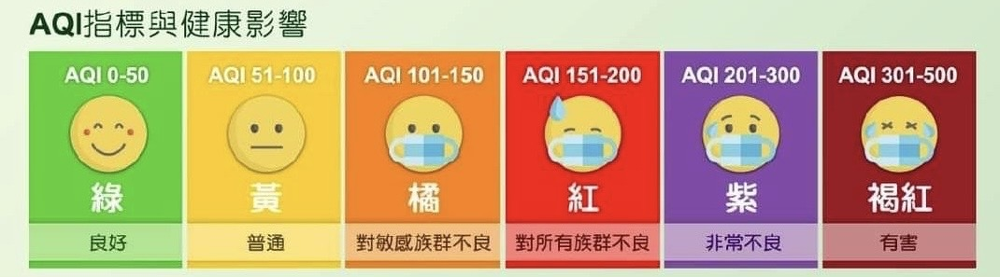
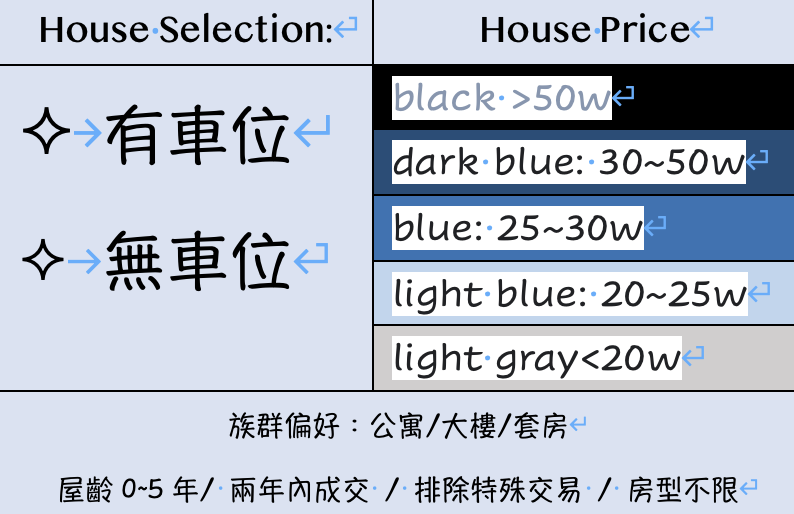

In [ ]:
display(dropdown)
display(submit)